# IBM-312 DATA MINING COURSE ASSIGNMENT
- Dawar Husain: 18115030
- Inzamam Khan: 18115042
- Keshav Dixit: 18115050
- Kshitij Bithel: 18115053
- Pranjal Mangal: 18115070

The Assignment presents an analysis on Mall Customers Dataset taken from https://www.udemy.com/course/machinelearning/ . The dataset contains the details of 200 customers having filters for Gender, Age, Annual Income and Spending Score.
- Genre: Male/Female
- Age: Age of the customer
- Annual Income: Annual Income (k$)
- Spending Score: Score calculated by Mall Authorities buying on buying pattern of the customer.

The dataset is trained using K-Means Clustering to identify clusters of customers to make an effective marketing and financial startegy for mall.

## Importing the libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from mpl_toolkits import mplot3d
%matplotlib inline
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

## Importing the dataset

In [2]:
dataset = pd.read_csv('https://raw.githubusercontent.com/Keshav242/IBM_project/main/Mall_Customers.csv')    #dataset stored in a github repository
X = dataset.iloc[:, [3, 4]].values                                                                          # Annual inc and spending score taken
Y = dataset.iloc[:, [2, 4]].values                                                                          # Age, Spending Score taken
Z = dataset.iloc[:, [2, 3]].values                                                                          # Age, Annual income taken
D3 = dataset.iloc[:, [2, 3, 4]].values                                                                      # All three parameters taken

dataset.head(5)

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


# Exploratory Data Analysis

In [3]:
dataset.isnull().any().any() # No null values i.e. dataset is clean

False

## Factor Distributions

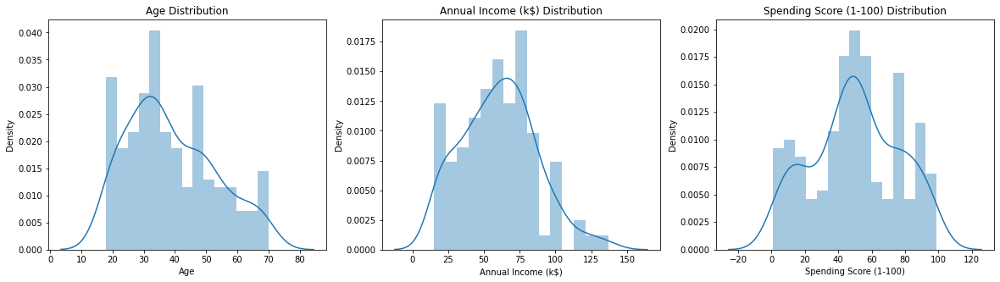

In [4]:
plt.figure(figsize = (20 , 5))
n=1
for x in ['Age' , 'Annual Income (k$)' , 'Spending Score (1-100)']:
    plt.subplot(1,3,n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.2)
    sns.distplot(dataset[x], bins = 15)
    plt.title('{} Distribution'.format(x))
    n+=1

# Age Histogram shows us that the average age of our customers is around 35. The age of our customers is typically between 20 and 70.

# Anual Income Histogram of majority of our customers have an annual income around 80K per annum. The salary ranges from 15k to 135k

## Male Female Anomaly

Text(0.5, 1.0, 'Male Female Disparity')

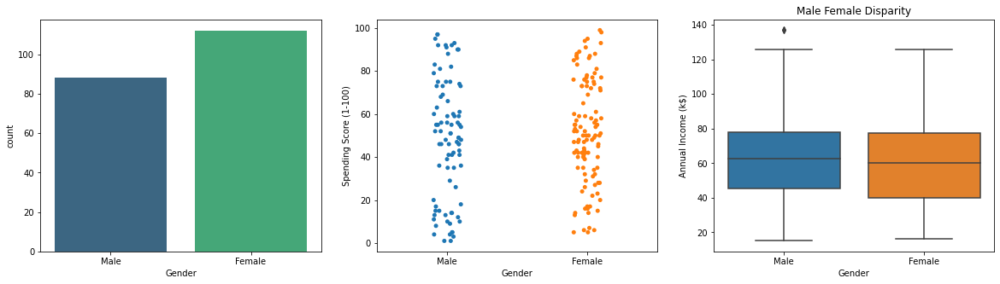

In [5]:
# plotting distribution in different features with respect to gender

plt.figure(figsize = (20 , 5))

plt.subplot(1,3,1)
plt.subplots_adjust(hspace =0.5 , wspace = 0.2)
sns.countplot(x='Gender', data=dataset, palette='viridis') # Data shows more female person captured in data.

plt.subplot(1,3,2)
plt.subplots_adjust(hspace =0.5 , wspace = 0.2)
sns.stripplot(x='Gender', y = 'Spending Score (1-100)', data = dataset) #Spending Score of Male & Female are similar.

plt.subplot(1,3,3)
plt.subplots_adjust(hspace =0.5 , wspace = 0.2)
sns.boxplot( x= 'Gender', y = 'Annual Income (k$)', data = dataset ) #Income of male and female are almost same.
plt.title('Male Female Disparity'.format(x))


## Pairwise Scatterplots/Distributions

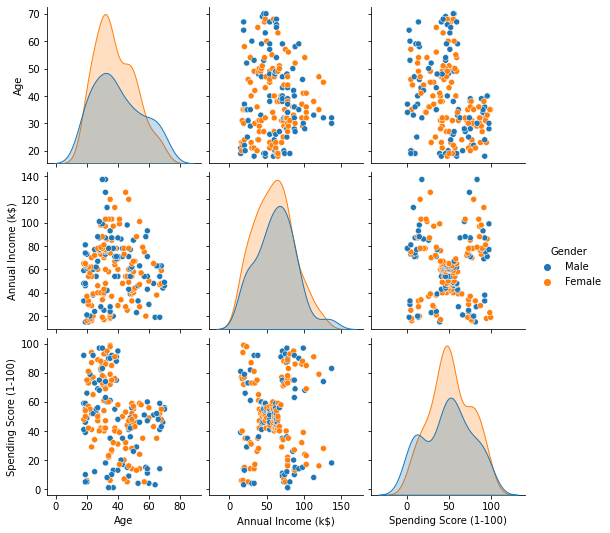

In [6]:
# This plot shows spread of the data on a scatter plot for two parameters taken at a time
# The row label (at the left) defines the Y-axis label for all the graphs in that row
# The column label (at the bottom) label defines the X-axis label for all the graphs in that column
# Male Female Disparity is not present here as well. i.e. the mall is situated in a locality where males and females are not biased. 
# There is not much correlation in the scatterplots which means our variables are independent. 
sns.pairplot(dataset[dataset.columns.drop('CustomerID')],hue='Gender')
plt.show()

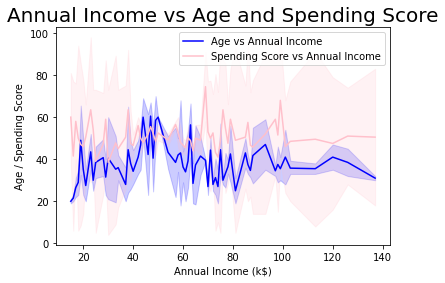

In [7]:
x = dataset['Annual Income (k$)']
y = dataset['Age']
z = dataset['Spending Score (1-100)']

sns.lineplot(x, y, color = 'blue')
sns.lineplot(x, z, color = 'pink')
plt.title('Annual Income vs Age and Spending Score', fontsize = 20)
plt.legend(['Age vs Annual Income','Spending Score vs Annual Income'])
plt.ylabel('Age / Spending Score')
plt.show()

# The age of customers is not very much dependent annual income except for people aged 40-60 years. 
# There is a very high non-correlation in this plot where people in certain annual income interval have a high std in Spending Score. 

# K-Means Clustering

## Using the Elbow method to find the optimal number of clusters

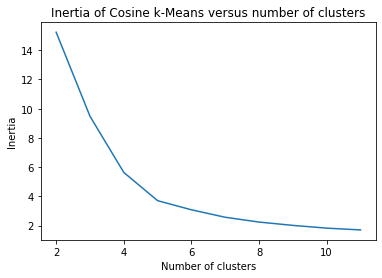

In [8]:
# Using Elbow Method to find out the optimum number of clusters

from sklearn import preprocessing
normalized_vectors = preprocessing.normalize(D3)                          # normalizing the parameters before passing to Kmeans
scores = [KMeans(n_clusters=i+2).fit(normalized_vectors).inertia_         # fitting the data for i+2 clusters and obtaining the score
          for i in range(10)]
sns.lineplot(np.arange(2, 12), scores)                                    # plotting the scores of each iteration
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of Cosine k-Means versus number of clusters")
plt.savefig("intertia_cosine_kmeans.jpg", dpi=300)

## The optimal number of clusters are 5.

## Visualising the clusters

### Spending Score vs Annual Income

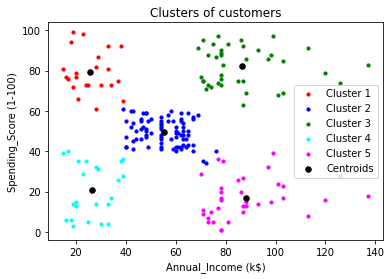

In [9]:
# Visualizing the clusters, hence using 2 parameters (Annual_Income, Spending_Score) to plot the clusters

kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
x_kmeans = kmeans.fit_predict(X)
plt.scatter(X[x_kmeans == 0, 0], X[x_kmeans == 0, 1], s = 10, c = 'red', label = 'Cluster 1')                       # plotting cluster1
plt.scatter(X[x_kmeans == 1, 0], X[x_kmeans == 1, 1], s = 10, c = 'blue', label = 'Cluster 2')                      # plotting cluster2
plt.scatter(X[x_kmeans == 2, 0], X[x_kmeans == 2, 1], s = 10, c = 'green', label = 'Cluster 3')                     # plotting cluster3
plt.scatter(X[x_kmeans == 3, 0], X[x_kmeans == 3, 1], s = 10, c = 'cyan', label = 'Cluster 4')                      # plotting cluster4
plt.scatter(X[x_kmeans == 4, 0], X[x_kmeans == 4, 1], s = 10, c = 'magenta', label = 'Cluster 5')                   # plotting cluster5
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 30, c = 'black', label = 'Centroids') # plotting centroids
plt.title('Clusters of customers')
plt.xlabel('Annual_Income (k$)')
plt.ylabel('Spending_Score (1-100)')
plt.legend()
plt.show()

### Spending_Score vs Age

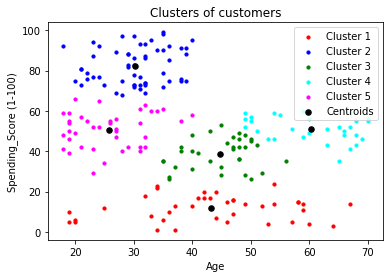

In [10]:
# Visualizing the clusters, hence using 2 parameters (Age, Spending_Score) to plot the clusters

kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(Y)
plt.scatter(Y[y_kmeans == 0, 0], Y[y_kmeans == 0, 1], s = 10, c = 'red', label = 'Cluster 1')
plt.scatter(Y[y_kmeans == 1, 0], Y[y_kmeans == 1, 1], s = 10, c = 'blue', label = 'Cluster 2')
plt.scatter(Y[y_kmeans == 2, 0], Y[y_kmeans == 2, 1], s = 10, c = 'green', label = 'Cluster 3')
plt.scatter(Y[y_kmeans == 3, 0], Y[y_kmeans == 3, 1], s = 10, c = 'cyan', label = 'Cluster 4')
plt.scatter(Y[y_kmeans == 4, 0], Y[y_kmeans == 4, 1], s = 10, c = 'magenta', label = 'Cluster 5')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 30, c = 'black', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('Age')
plt.ylabel('Spending_Score (1-100)')
plt.legend()
plt.show()

### Annual Income vs Age

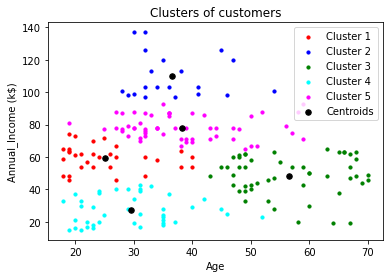

In [11]:
# Visualizing the clusters, hence using 2 parameters (Age, Spending_Score) to plot the clusters

kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(Z)
plt.scatter(Z[y_kmeans == 0, 0], Z[y_kmeans == 0, 1], s = 10, c = 'red', label = 'Cluster 1')
plt.scatter(Z[y_kmeans == 1, 0], Z[y_kmeans == 1, 1], s = 10, c = 'blue', label = 'Cluster 2')
plt.scatter(Z[y_kmeans == 2, 0], Z[y_kmeans == 2, 1], s = 10, c = 'green', label = 'Cluster 3')
plt.scatter(Z[y_kmeans == 3, 0], Z[y_kmeans == 3, 1], s = 10, c = 'cyan', label = 'Cluster 4')
plt.scatter(Z[y_kmeans == 4, 0], Z[y_kmeans == 4, 1], s = 10, c = 'magenta', label = 'Cluster 5')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 30, c = 'black', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('Age')
plt.ylabel('Annual_Income (k$)')
plt.legend()
plt.show()

## Using Age, Annual Income and Spending Score as Feature set

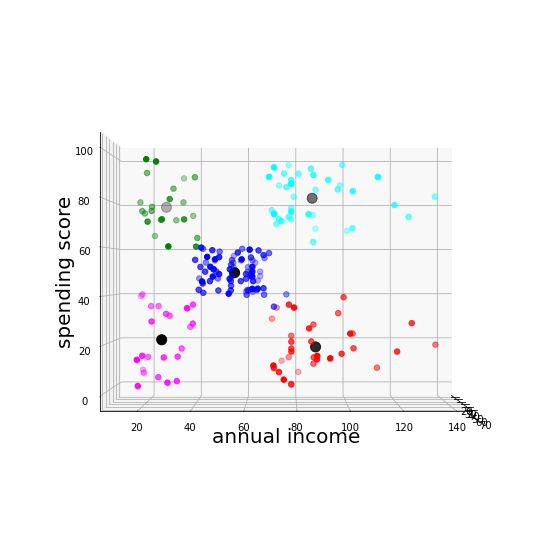

<Figure size 432x288 with 0 Axes>

In [12]:
# Visualizing the clusters on a 3D plot and checking the dependence of parameters on the clusters formed

kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
d3_kmeans = kmeans.fit_predict(D3)

fig = plt.figure(figsize=(20, 10))                                               # for 3D plot
ax = fig.add_subplot(projection='3d')                                            #
# ax.set_xlabel("Age", fontsize=20)                                                #
ax.set_ylabel("annual income", fontsize=20)                                      #
ax.set_zlabel("spending score", fontsize=20)
ax.view_init(0, 0)                                                               #


# Performing KMeans on the three parameters

ax.scatter3D(D3[d3_kmeans == 0, 0], D3[d3_kmeans == 0, 1], D3[d3_kmeans == 0, 2], s = 30, c = 'red', label = 'Cluster 1')
ax.scatter3D(D3[d3_kmeans == 1, 0], D3[d3_kmeans == 1, 1], D3[d3_kmeans == 1, 2], s = 30, c = 'blue', label = 'Cluster 2')
ax.scatter3D(D3[d3_kmeans == 2, 0], D3[d3_kmeans == 2, 1], D3[d3_kmeans == 2, 2], s = 30, c = 'green', label = 'Cluster 3')
ax.scatter3D(D3[d3_kmeans == 3, 0], D3[d3_kmeans == 3, 1], D3[d3_kmeans == 3, 2], s = 30, c = 'cyan', label = 'Cluster 4')
ax.scatter3D(D3[d3_kmeans == 4, 0], D3[d3_kmeans == 4, 1], D3[d3_kmeans == 4, 2], s = 30, c = 'magenta', label = 'Cluster 5')
ax.scatter3D(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], s = 100, c = 'black', label = 'Centroids')
plt.pause(0.1)
plt.clf()

## 3-D Visualization of Clusters

In [13]:
# Generating 3d animation of the
from matplotlib import animation,rc
import matplotlib
def update(num):
        ax.view_init(15,(50-num))

rc('animation', html='jshtml')
matplotlib.rcParams['animation.embed_limit'] = 2**128
N=100
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel("Age")
ax.set_ylabel("annual income")
ax.set_zlabel("spending score")
ax.scatter3D(D3[d3_kmeans == 0, 0], D3[d3_kmeans == 0, 1], D3[d3_kmeans == 0, 2], s = 30, c = 'red', label = 'Cluster 1')
ax.scatter3D(D3[d3_kmeans == 1, 0], D3[d3_kmeans == 1, 1], D3[d3_kmeans == 1, 2], s = 30, c = 'blue', label = 'Cluster 2')
ax.scatter3D(D3[d3_kmeans == 2, 0], D3[d3_kmeans == 2, 1], D3[d3_kmeans == 2, 2], s = 30, c = 'green', label = 'Cluster 3')
ax.scatter3D(D3[d3_kmeans == 3, 0], D3[d3_kmeans == 3, 1], D3[d3_kmeans == 3, 2], s = 30, c = 'cyan', label = 'Cluster 4')
ax.scatter3D(D3[d3_kmeans == 4, 0], D3[d3_kmeans == 4, 1], D3[d3_kmeans == 4, 2], s = 30, c = 'magenta', label = 'Cluster 5')
ax.scatter3D(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], s = 80, c = 'black', label = 'Centroids')
plt.tight_layout()
ani = animation.FuncAnimation(fig, update, N, blit=False, interval=100)
plt.close()

In [14]:
ani

## Principal Component Analysis

Eigen Values =  [167.22852389 700.26435482 684.33013636] 
 Eigen Vectors =  [[ 0.97320957  0.1889742  -0.1309652 ]
 [ 0.00551667 -0.58864102 -0.80837573]
 [ 0.22985365 -0.7859965   0.57391358]]
(200, 3) (3, 2)


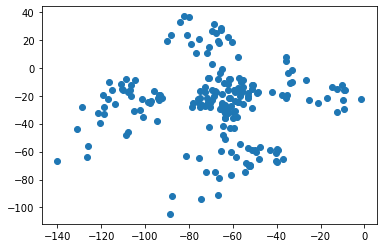

In [15]:
#Performing PCA to show that the dependance of the clusters are only on two parameters.

sigma = np.cov(np.transpose(D3))
D, EV = np.linalg.eig(sigma)
print("Eigen Values = ", D,"\n Eigen Vectors = ", EV)
P = EV[:, 1:]
print(D3.shape,P.shape)
PCA = np.matmul(D3, P)
plt.scatter(PCA[:, 0], PCA[:, 1])

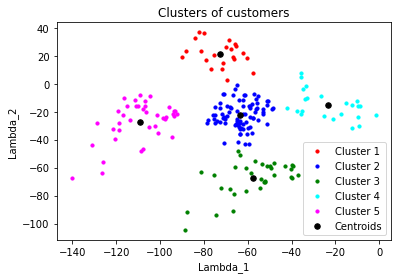

In [16]:
# Performing K-Means on the set of features obtained after the processing through PCA

pca_kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
p_kmeans = pca_kmeans.fit_predict(PCA)
plt.scatter(PCA[p_kmeans == 0, 0], PCA[p_kmeans == 0, 1], s = 10, c = 'red', label = 'Cluster 1')
plt.scatter(PCA[p_kmeans == 1, 0], PCA[p_kmeans == 1, 1], s = 10, c = 'blue', label = 'Cluster 2')
plt.scatter(PCA[p_kmeans == 2, 0], PCA[p_kmeans == 2, 1], s = 10, c = 'green', label = 'Cluster 3')
plt.scatter(PCA[p_kmeans == 3, 0], PCA[p_kmeans == 3, 1], s = 10, c = 'cyan', label = 'Cluster 4')
plt.scatter(PCA[p_kmeans == 4, 0], PCA[p_kmeans == 4, 1], s = 10, c = 'magenta', label = 'Cluster 5')
plt.scatter(pca_kmeans.cluster_centers_[:, 0], pca_kmeans.cluster_centers_[:, 1], s = 30, c = 'black', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('Lambda_1')
plt.ylabel('Lambda_2')
plt.legend()
plt.show()

# Conclusion

## Cluster Information

In [17]:
df=dataset
df['cluster_group'] = kmeans.labels_
df=df.groupby("cluster_group")
details=df.describe()
details

CustomerID                                                     \
                   count        mean        std    min    25%    50%    75%   
cluster_group                                                                 
0                   36.0  163.500000  21.785316  125.0  146.5  164.0  181.5   
1                   79.0   86.265823  23.490156   47.0   66.5   86.0  105.5   
2                   23.0   24.000000  13.564660    2.0   13.0   24.0   35.0   
3                   39.0  162.000000  22.803509  124.0  143.0  162.0  181.0   
4                   23.0   23.000000  13.564660    1.0   12.0   23.0   34.0   

                       Age             ... Annual Income (k$)         \
                 max count       mean  ...                75%    max   
cluster_group                          ...                             
0              199.0  36.0  40.666667  ...              97.25  137.0   
1              143.0  79.0  43.088608  ...              62.00   76.0   
2               46.0  23.0  25.521739  ...              33.00   39.0   
3              200.0  39.0  32.692308  ...              95.00  137.0   
4               45.0  23.0  45.217391  ...              33.00   39.0   

              Spending Score (1-100)                                          \
                               count       mean        std   min   25%   50%   
cluster_group                                                                  
0                               36.0  17.583333  10.204691   1.0  10.0  16.0   
1                               79.0  49.569620   6.242295  35.0  44.5  50.0   
2                               23.0  78.565217  10.953729  61.0  73.0  77.0   
3                               39.0  82.128205   9.364489  63.0  74.5  83.0   
4                               23.0  20.913043  13.017167   3.0   9.5  17.0   

                           
                75%   max  
cluster_group              
0              24.5  39.0  
1              55.0  60.0  
2              84.5  99.0  
3              90.0  97.0  
4              33.5  40.0  

[5 rows x 32 columns]

<AxesSubplot:ylabel='count'>

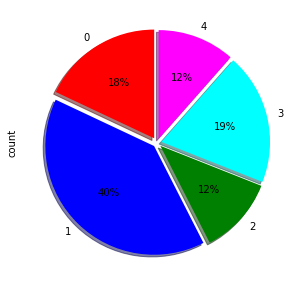

In [18]:
colors = ["red", "blue","green","cyan","magenta"]
details['CustomerID']['count'].plot(kind='pie',figsize=(20,5),colors= colors,startangle= 90,explode = [0.05,0.04,0.04,0.04,0.04],shadow = True,autopct='%1.0f%%')

## Cluster Analysis

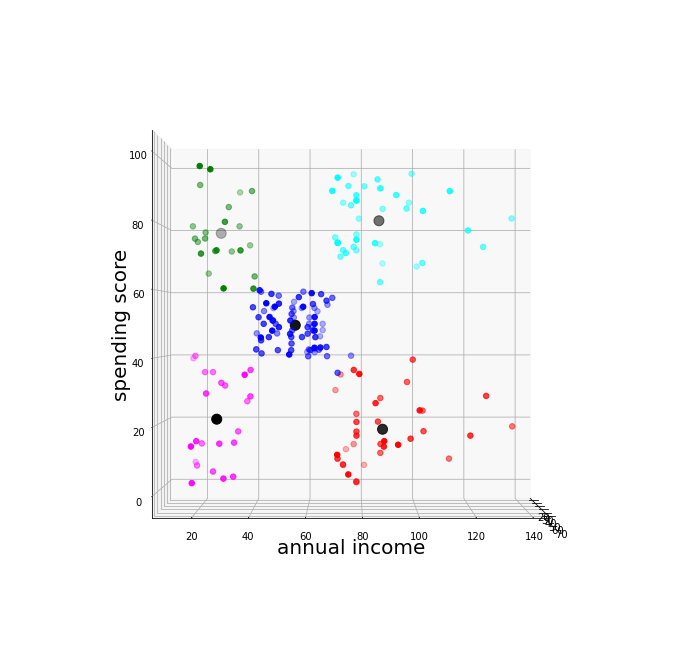

## Green Cluster
It represents the set which has less income and high spending scores.
It comprises quite less percentage(12%) of people. This means that there are not many people around the mall which have a low income and still try to live a luxurious life.
So following the work ethics we should not target them and should not tempt them to spend more.

## Blue Cluster
This set represents the people who have average annual income and average Spending Score.
These people comprise the highest percentage of the set(40%). This means that the mall is situated in a local locality and not very famous to attract rich customers. Hence, products of particular interest to this section should be kept to generate a regular income from these people.
We can encourage these people to spend more so that they try to improve their annual income.

## Cyan Cluster
It represents the set which has high income and high spending scores.
Since they are spending the most and have high income we should target them more. Proper luxurious spaces can be designed with extra comfort and talented executives for this particular section of people to get most out of their pockets since they comprise of second highest in the count(19%). 

## Magenta Cluster
This cluster consists of people with relatively low expenditure and low income. 
Visitors in this section are limited(12%) which means that the mall is bit expensive and not affordable by all.

## Red Cluster
It represents the set which has high income but low spending scores. The super rich section of the society having the lowest average spending score should be a bit astonishing to the mall administartion. The reasons may be poor appropriate sized parking spaces, hygiene or security.
Despite having high income they are spending less so we should take feedback from these customers and bring their recommended products in malls and provide attractive discounts.
